# import

In [1]:
import cv2
import os
import os.path as osp
from glob import glob
from tqdm import tqdm
import pickle
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# path

In [2]:
data_name = 'player'
input_dir = osp.join('../input', data_name)
data_dir = osp.join('../output', data_name, 'tracking')
label_save_dir = osp.join('../output', data_name, 'label')
reid_dir = osp.join('../output', data_name, 'reid')
track_label_path = osp.join('../output/')
movie_dir = osp.join('../output', data_name, 'movie')

# function

In [3]:
def listdirs(dir_path, name_condition=None):
    dir_names = os.listdir(dir_path)
    if name_condition is not None:
        dir_names = [dir_name for dir_name in dir_names if dir_name.startswith(name_condition)]
    dir_names.sort()
    return dir_names

In [4]:
def save_pickle(data, path):
    with open(path, 'wb') as f:
        pickle.dump(data, f)


def load_pickle(path):
    with open(path, 'rb') as f:
        data = pickle.load(f)
    return data

In [5]:
def draw_bbox(img, bboxes, c=(0,255,0)):
    for bbox in bboxes:
        cv2.rectangle(img, (int(bbox[0]), int(bbox[1])), 
                      (int(bbox[0] + bbox[2]), int(bbox[1] + bbox[3])), 
                      (0,255,0), 2, lineType=cv2.LINE_AA)
        ct = [bbox[0] + bbox[2] / 2, bbox[1] + bbox[3] / 2]
        txt = '{}'.format(bbox[4])
        cv2.putText(img, txt, (int(ct[0]), int(ct[1])), 
                    cv2.FONT_HERSHEY_SIMPLEX, 0.5, 
                    (0, 0, 0), thickness=3, lineType=cv2.LINE_AA)
        cv2.putText(img, txt, (int(ct[0]), int(ct[1])), 
                    cv2.FONT_HERSHEY_SIMPLEX, 0.5, 
                    c, thickness=2, lineType=cv2.LINE_AA)

# track pid

track_pid_paths = glob(osp.join(reid_dir, game, '*.csv'))
track_pid_df_list = []
for track_pid_path in track_pid_paths:
    person_name = osp.splitext(osp.basename(track_pid_path))[0]
    track_pid_df = pd.read_csv(track_pid_path)
    track_pid_df['person_name'] = None
    track_pid_df.loc[track_pid_df.person==1, 'person_name'] = person_name
    track_pid_df_list.append(track_pid_df)
track_pid_df = pd.concat(track_pid_df_list)

# show tracking image

In [12]:
# games = ['game3']

Murray
==================== Clip9 ====================
game3 Clip9 00001 0.623932123184204 136


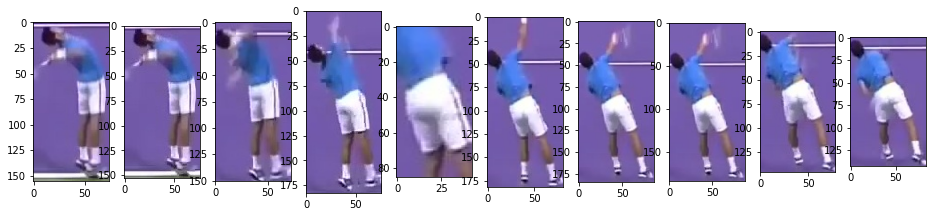

game3 Clip9 00008 0.5374543666839601 136


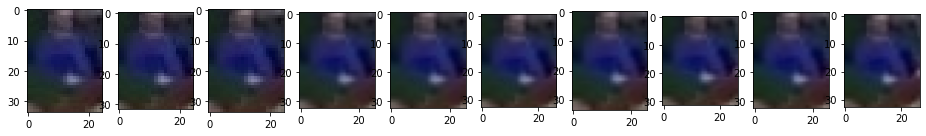

game3 Clip9 00003 0.5179482698440551 136


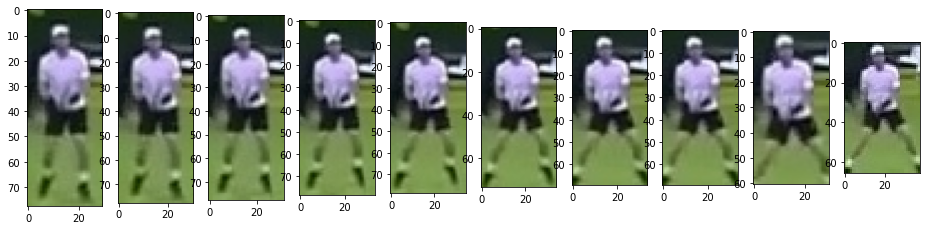

game3 Clip9 00064 0.403975397348404 54


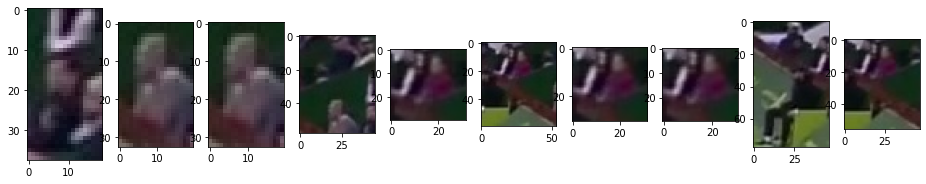

==================== Clip8 ====================
game3 Clip8 00001 0.684495568275452 46


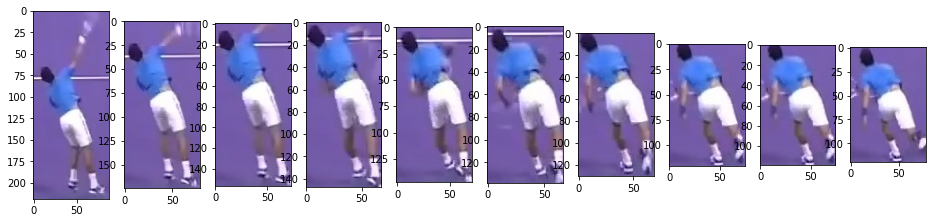

game3 Clip8 00024 0.5846855044364929 44


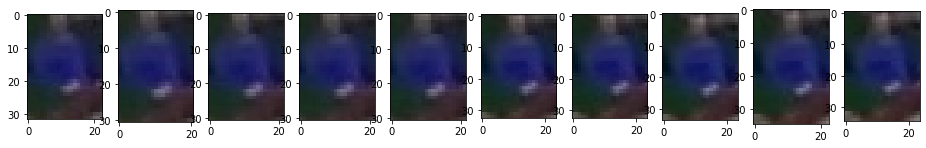

game3 Clip8 00002 0.498307973146439 36


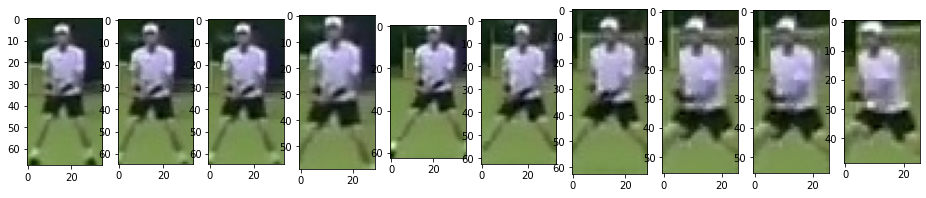

==================== Clip7 ====================
game3 Clip7 00006 0.6512020230293271 311


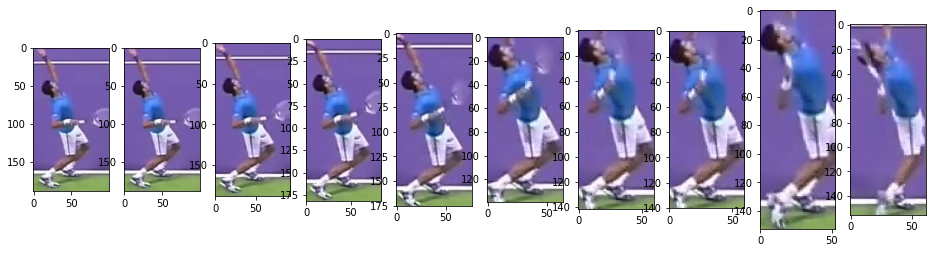

game3 Clip7 00184 0.6439720392227171 1


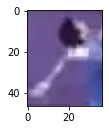

game3 Clip7 00239 0.531626999378204 8


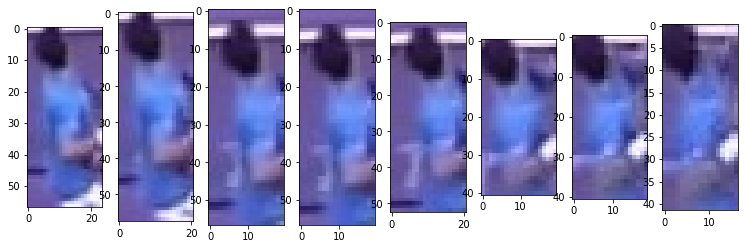

game3 Clip7 00007 0.524283528327942 105


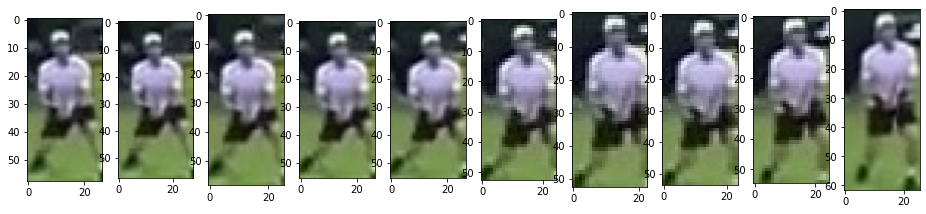

game3 Clip7 00232 0.5049607753753661 2


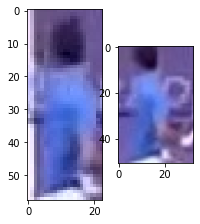

game3 Clip7 00235 0.4538583159446721 5


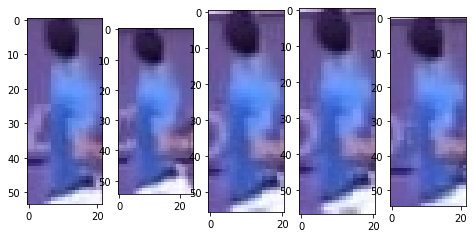

game3 Clip7 00233 0.43619704246521 4


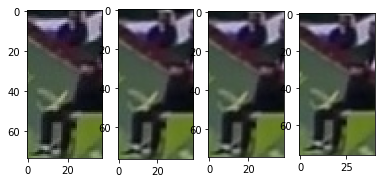

game3 Clip7 00223 0.43490290641784707 15


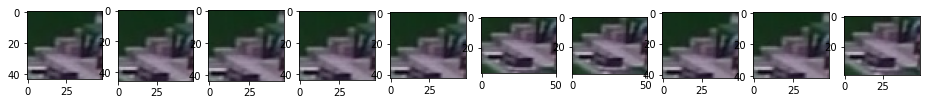

game3 Clip7 00113 0.43271553516387895 40


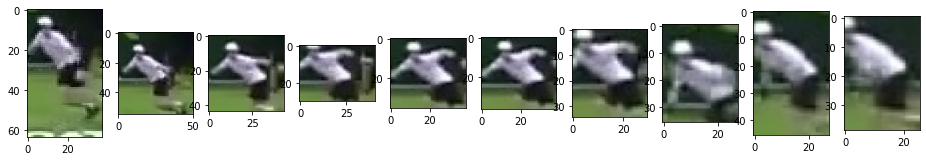

game3 Clip7 00219 0.43202376365661604 1


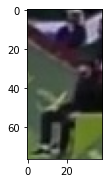

game3 Clip7 00221 0.431452244520187 49


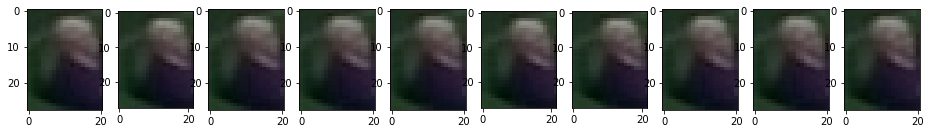

game3 Clip7 00115 0.430855393409729 205


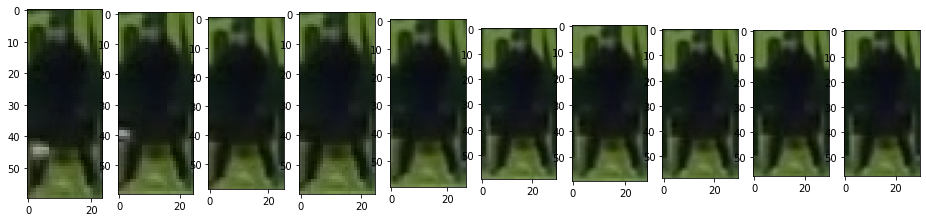

game3 Clip7 00225 0.419603228569031 1


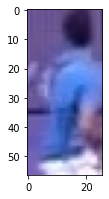

game3 Clip7 00241 0.418412566184998 8


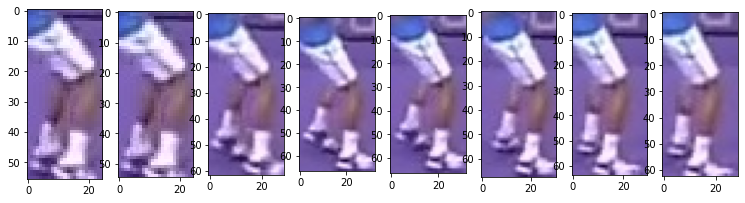

game3 Clip7 00049 0.41832619905471796 1


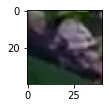

game3 Clip7 00199 0.41041988134384205 8


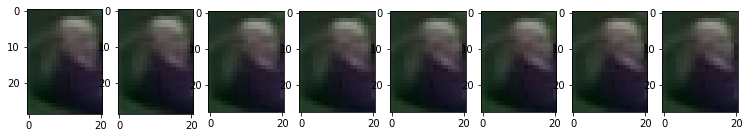

game3 Clip7 00205 0.40933343768119795 18


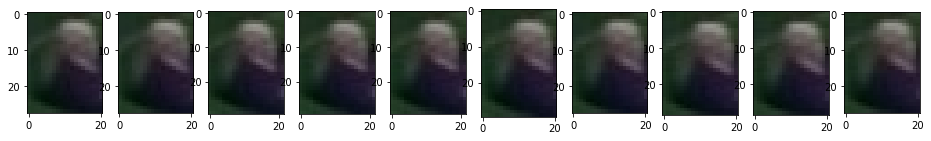

==================== Clip6 ====================
game3 Clip6 00005 0.676690757274628 237


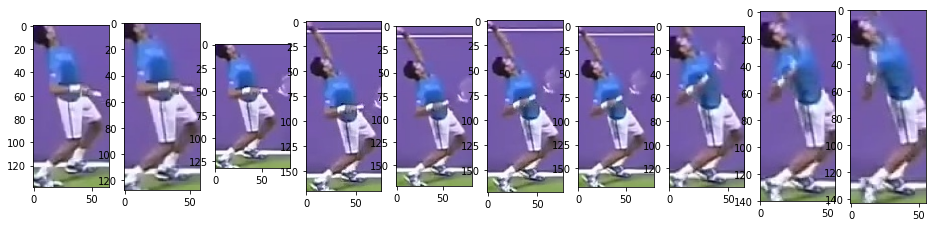

game3 Clip6 00003 0.516364455223084 205


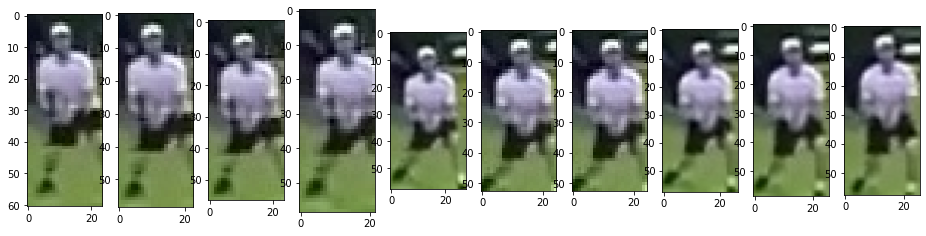

game3 Clip6 00123 0.468777567148209 10


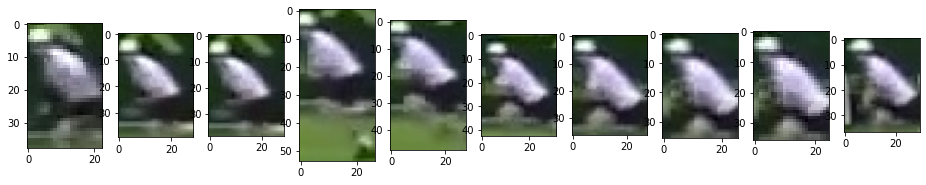

game3 Clip6 00112 0.43207889795303395 1


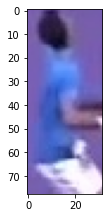

game3 Clip6 00117 0.40579539537429793 2


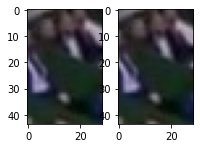

==================== Clip5 ====================
game3 Clip5 00009 0.6588080525398249 132


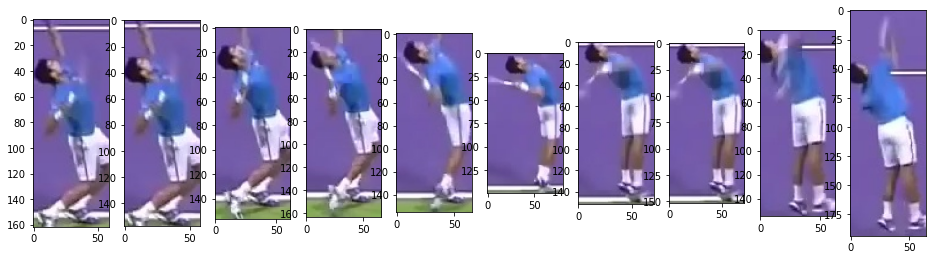

game3 Clip5 00007 0.47974801063537603 132


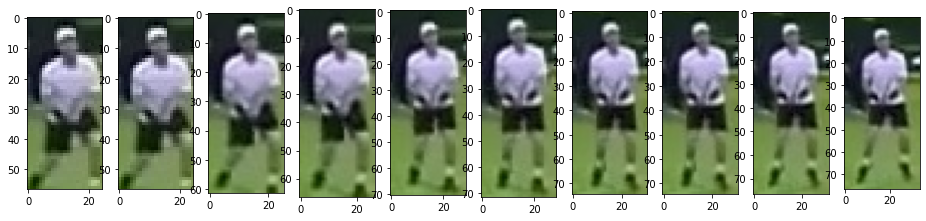

game3 Clip5 00011 0.42381393909454296 132


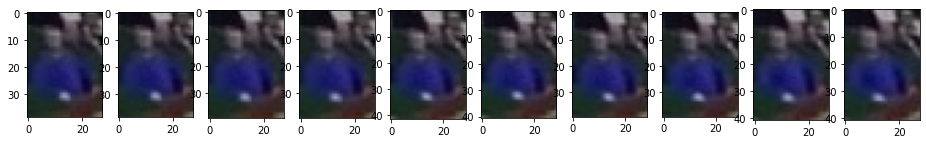

==================== Clip4 ====================
game3 Clip4 00002 0.7188944220542909 348


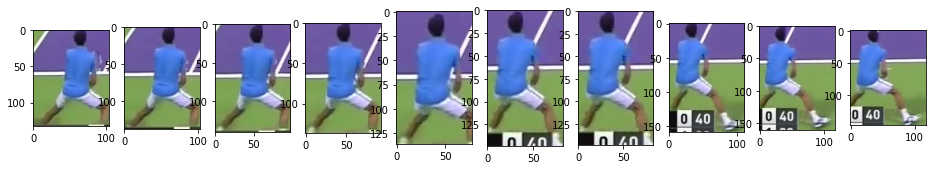

game3 Clip4 00302 0.619212865829468 53


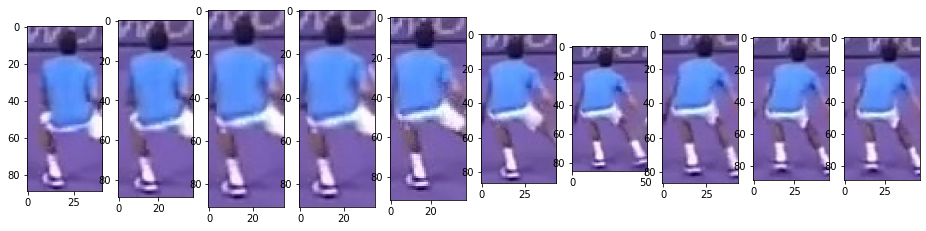

game3 Clip4 00339 0.562230288982391 18


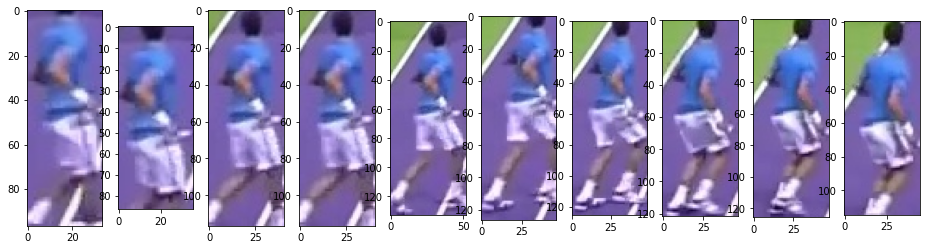

game3 Clip4 00341 0.546505093574524 1


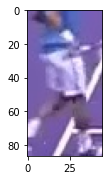

game3 Clip4 00068 0.54144811630249 368


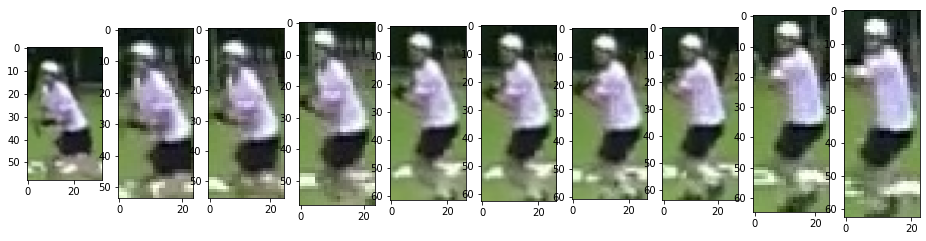

game3 Clip4 00338 0.49563193321228005 6


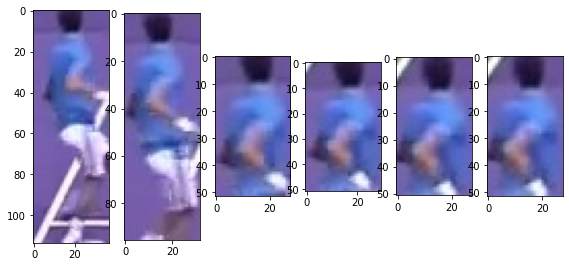

game3 Clip4 00347 0.466655820608139 2


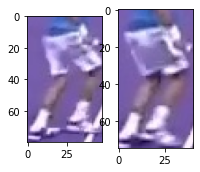

game3 Clip4 00001 0.433028310537338 129


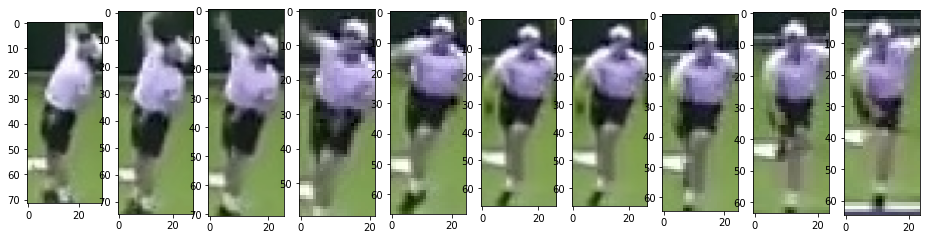

game3 Clip4 00344 0.42349883913993797 3


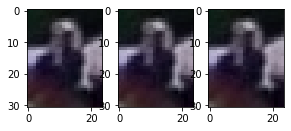

game3 Clip4 00323 0.41913703083992 3


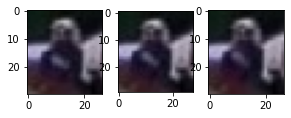

game3 Clip4 00277 0.4164754152297971 5


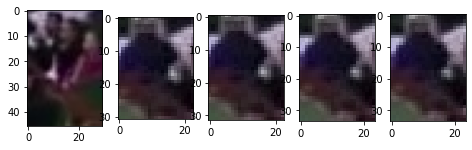

game3 Clip4 00010 0.41641676425933793 416


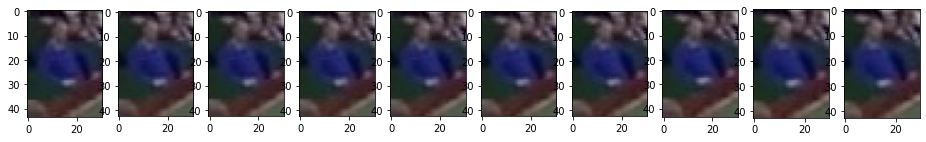

game3 Clip4 00274 0.413965493440628 2


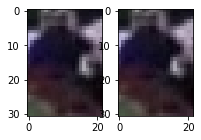

game3 Clip4 00012 0.407402634620667 73


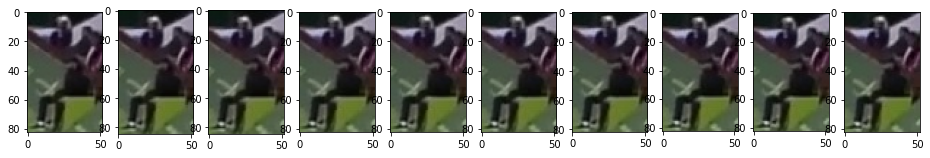

==================== Clip3 ====================
game3 Clip3 00002 0.7404590845108029 397


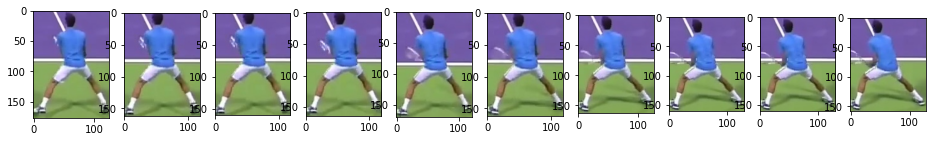

game3 Clip3 00004 0.5349140167236329 313


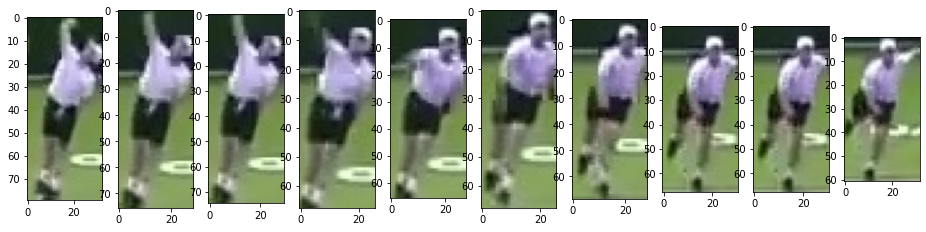

game3 Clip3 00071 0.48819363117218 1


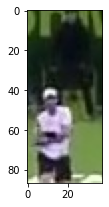

game3 Clip3 00074 0.475511103868485 7


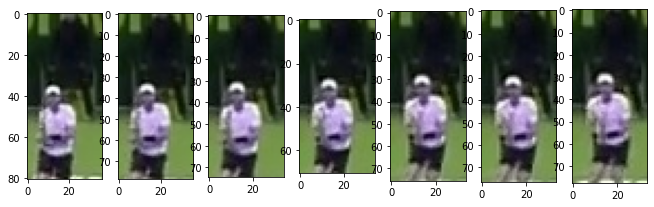

game3 Clip3 00085 0.44426178932189897 2


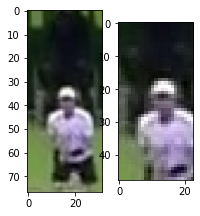

game3 Clip3 00260 0.42351159453392 85


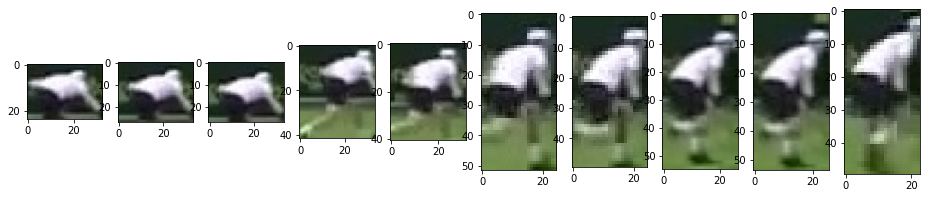

game3 Clip3 00032 0.416602969169617 4


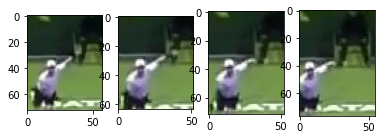

game3 Clip3 00013 0.416227638721466 397


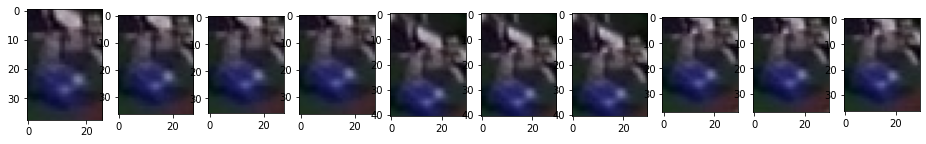

==================== Clip2 ====================
game3 Clip2 00001 0.970410764217377 28


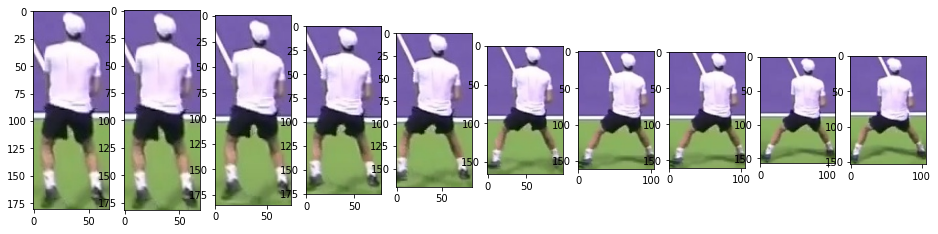

game3 Clip2 00005 0.553387880325317 28


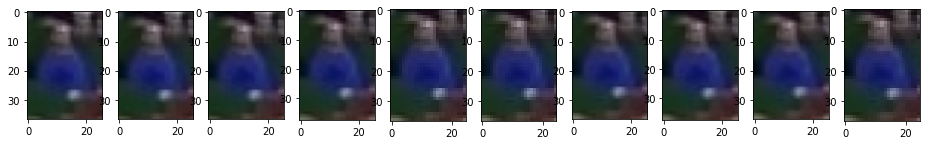

game3 Clip2 00033 0.537725269794464 20


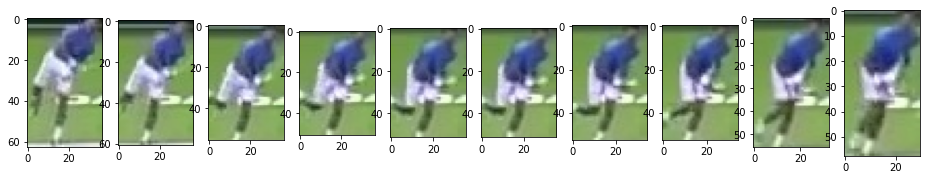

game3 Clip2 00003 0.508499920368195 12


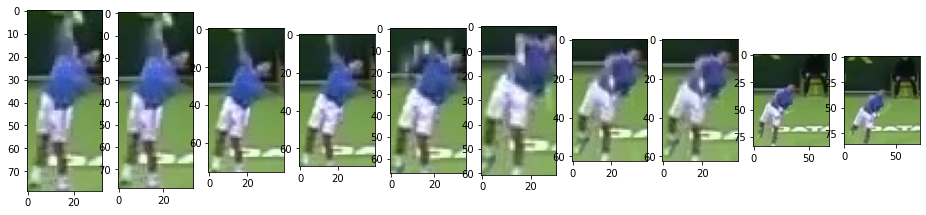

game3 Clip2 00008 0.44513463973999 28


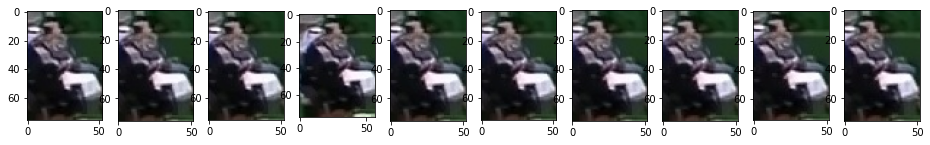

==================== Clip1 ====================
game3 Clip1 00001 0.99999988079071 176


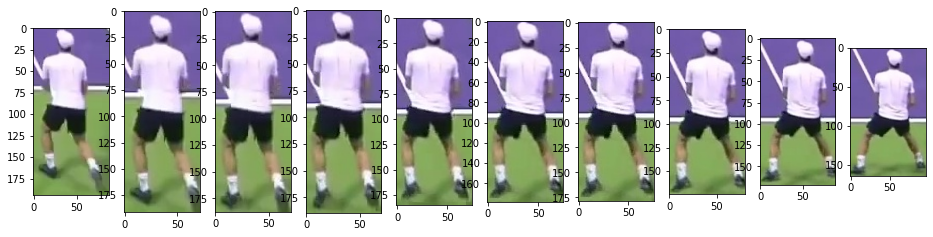

game3 Clip1 00032 0.654763698577881 1


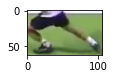

game3 Clip1 00104 0.6165823340415949 8


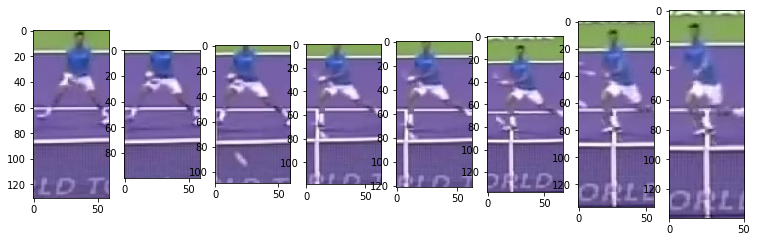

game3 Clip1 00006 0.591208457946777 176


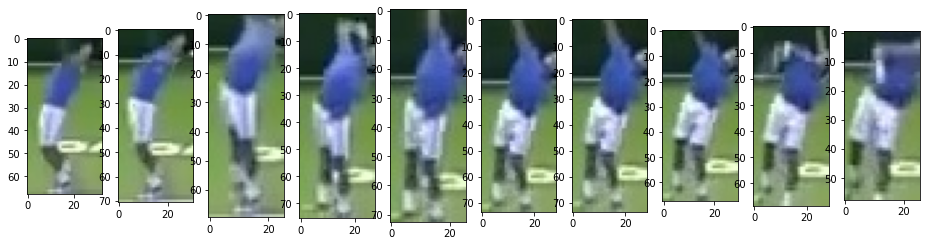

game3 Clip1 00054 0.48989978432655296 1


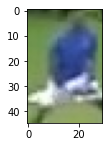

game3 Clip1 00011 0.429827392101288 176


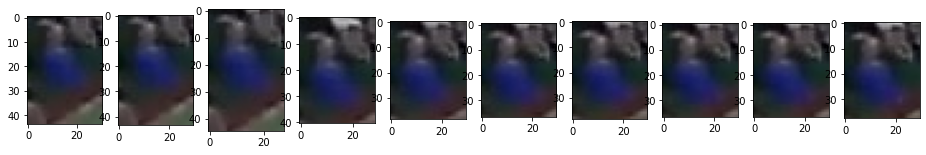

Djokovic
==================== Clip9 ====================
game3 Clip9 00001 0.7604142427444459 136


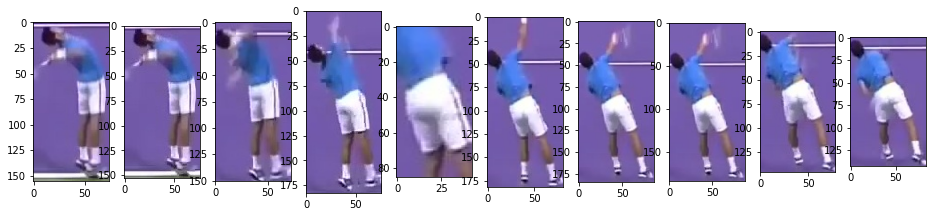

game3 Clip9 00008 0.6413015723228449 136


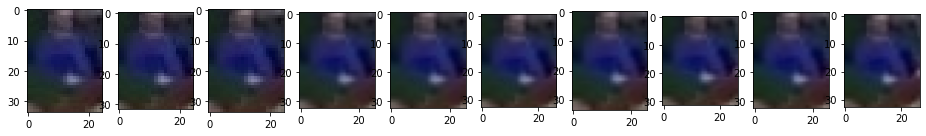

game3 Clip9 00058 0.53509658575058 111


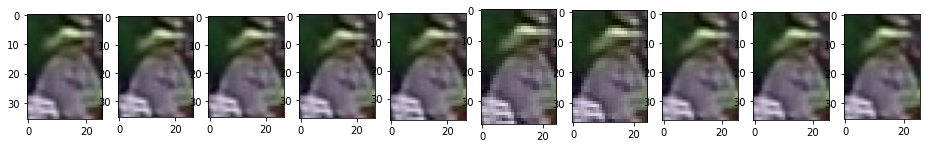

game3 Clip9 00054 0.526711225509644 55


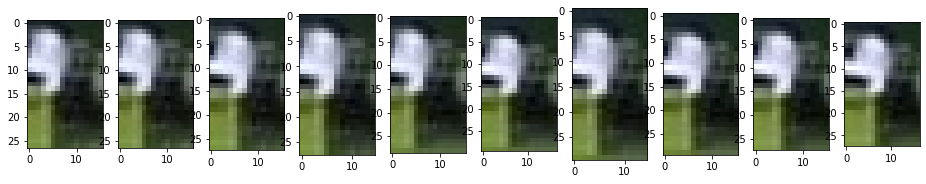

game3 Clip9 00059 0.519253492355347 37


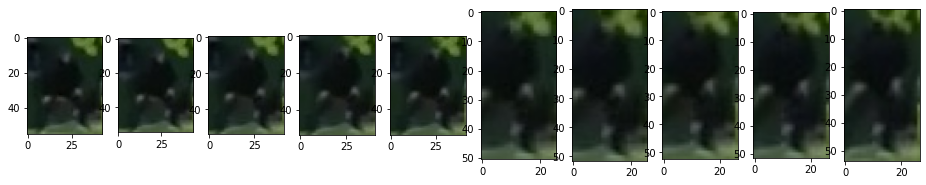

game3 Clip9 00072 0.5117769837379461 86


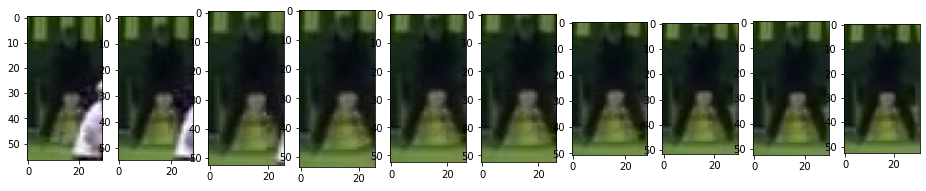

game3 Clip9 00004 0.49760690331459 41


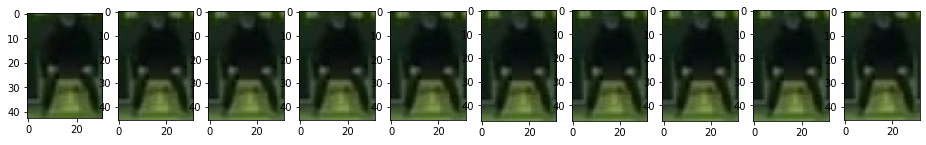

game3 Clip9 00102 0.49565809965133706 1


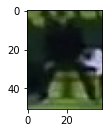

game3 Clip9 00104 0.490382850170136 61


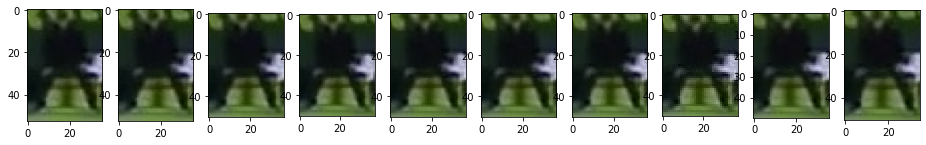

game3 Clip9 00065 0.48407122492790206 102


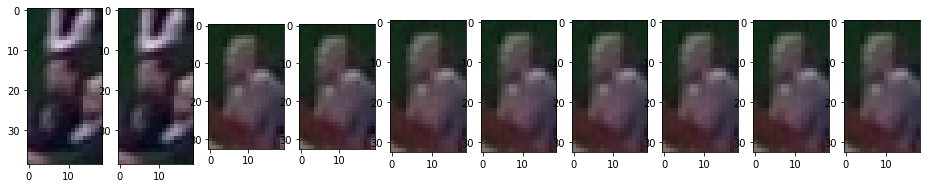

game3 Clip9 00047 0.48139846324920704 12


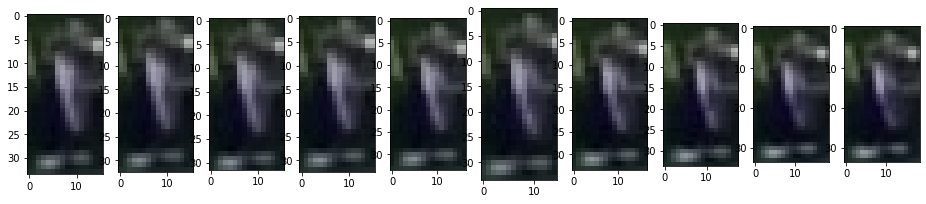

game3 Clip9 00027 0.479194581508637 135


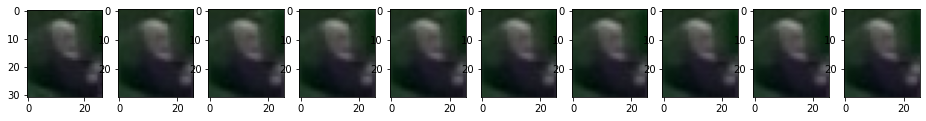

game3 Clip9 00033 0.47725677490234397 130


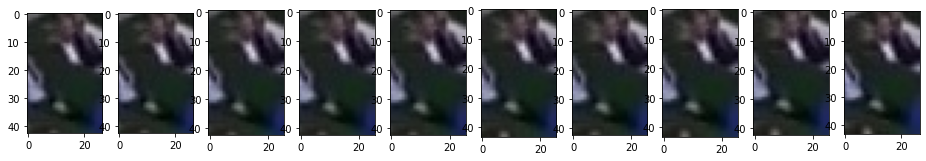

game3 Clip9 00018 0.47646123170852706 136


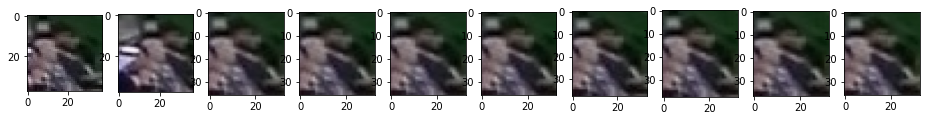

game3 Clip9 00134 0.475505620241165 1


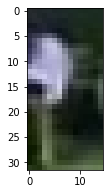

game3 Clip9 00068 0.468833208084106 23


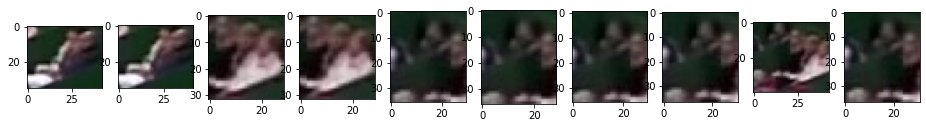

game3 Clip9 00037 0.46757060289382896 4


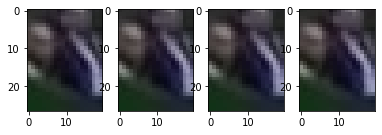

game3 Clip9 00015 0.466967940330505 33


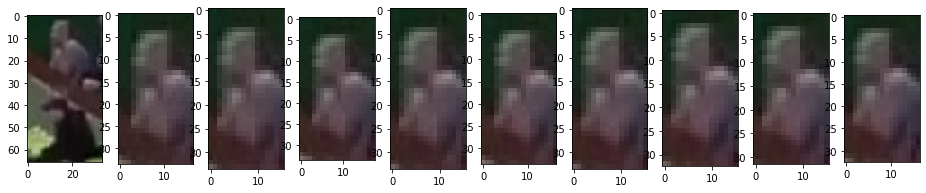

game3 Clip9 00132 0.46667030453681896 7


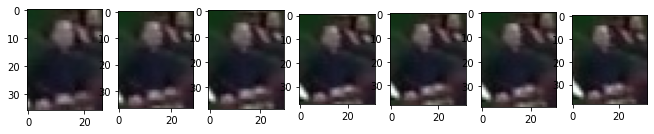

game3 Clip9 00111 0.466430455446243 6


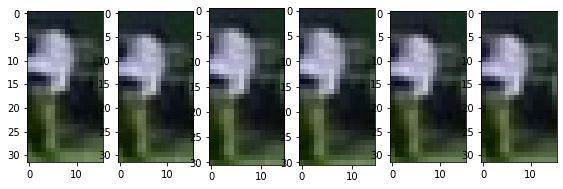

game3 Clip9 00035 0.46143877506256104 43


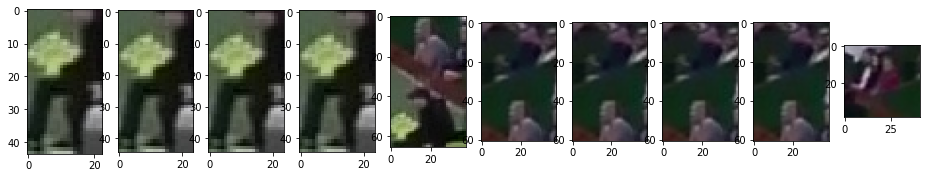

game3 Clip9 00057 0.46074733138084395 9


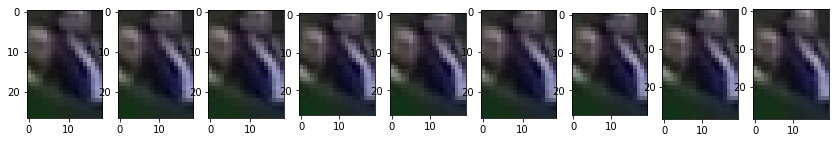

game3 Clip9 00108 0.46004974842071505 7


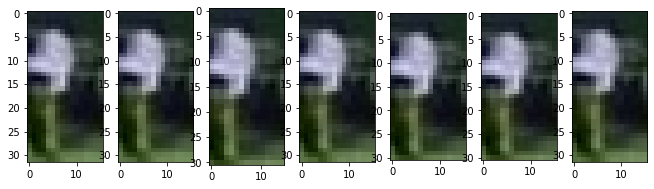

game3 Clip9 00002 0.46003580093383795 136


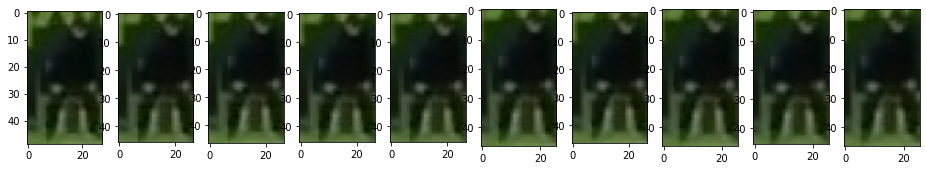

game3 Clip9 00003 0.45972281694412204 136


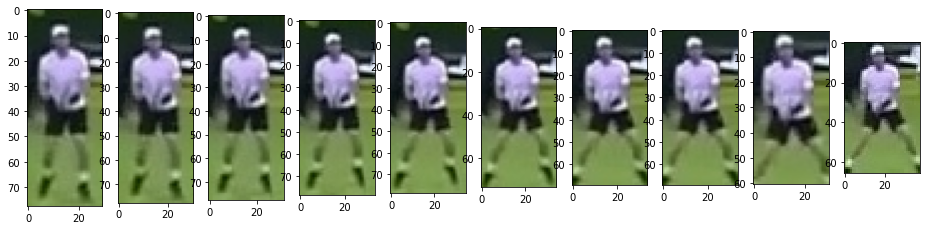

game3 Clip9 00043 0.4587961137294771 20


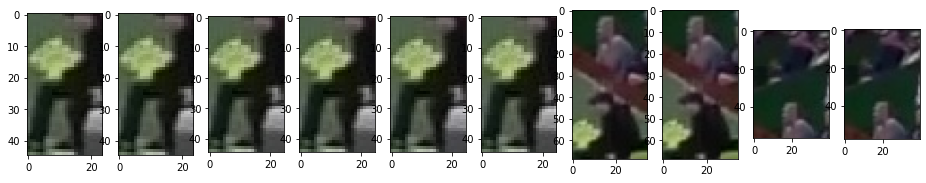

game3 Clip9 00042 0.45729070901870705 124


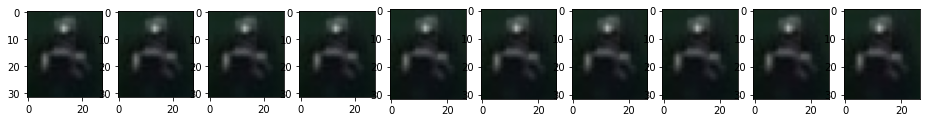

game3 Clip9 00067 0.451560914516449 39


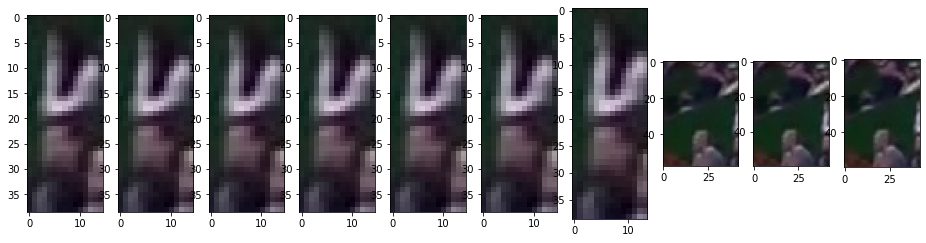

game3 Clip9 00119 0.449055850505829 12


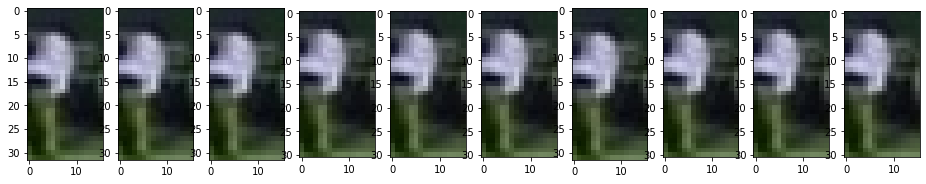

game3 Clip9 00066 0.44154804944992104 4


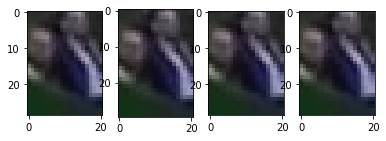

game3 Clip9 00120 0.43753245472908003 38


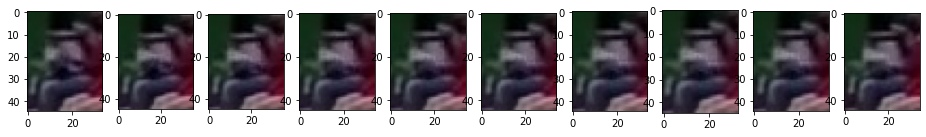

game3 Clip9 00091 0.43395435810089095 12


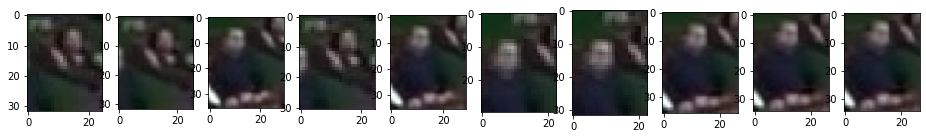

game3 Clip9 00020 0.42627966403961204 50


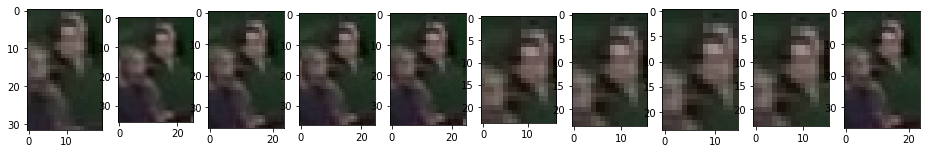

game3 Clip9 00061 0.42435222864151 106


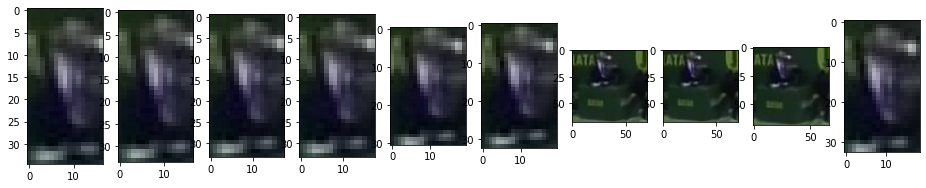

game3 Clip9 00071 0.41587597131729104 90


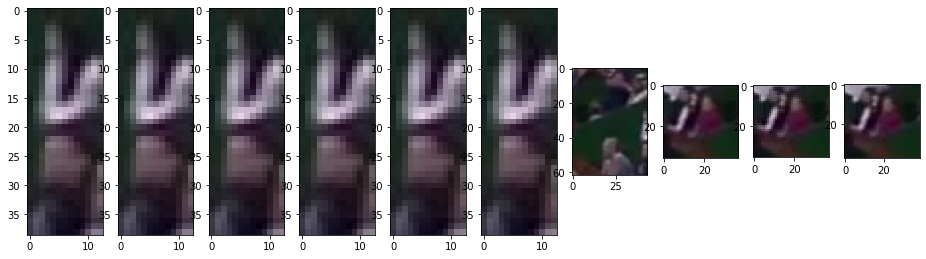

game3 Clip9 00064 0.408506333827972 54


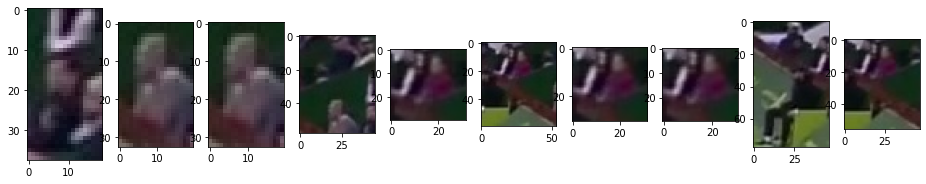

game3 Clip9 00023 0.408287525177002 27


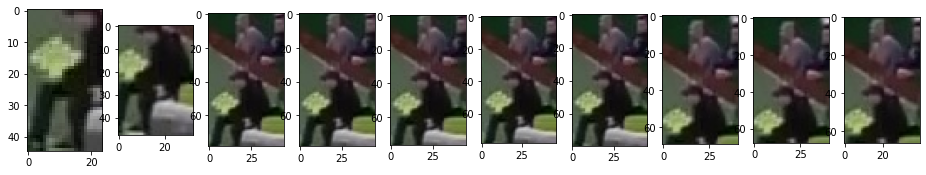

game3 Clip9 00092 0.40767073631286604 66


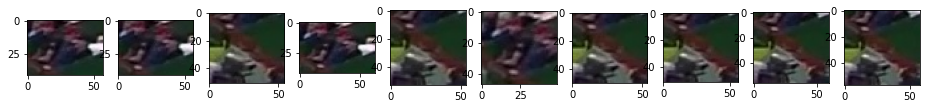

game3 Clip9 00075 0.40497019886970503 59


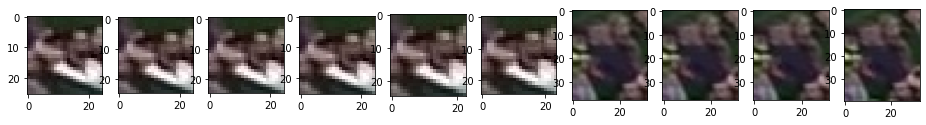

game3 Clip9 00024 0.40352243185043296 124


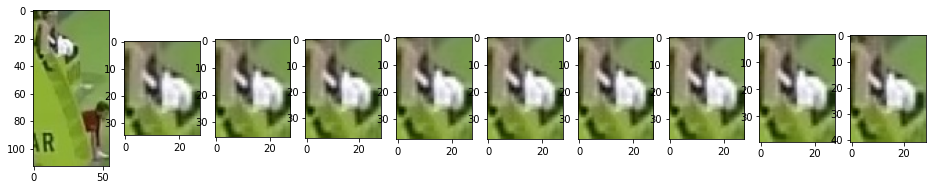

game3 Clip9 00086 0.40207913517952004 3


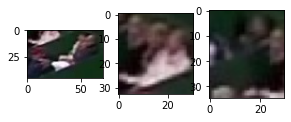

==================== Clip8 ====================
game3 Clip8 00001 0.776245653629303 46


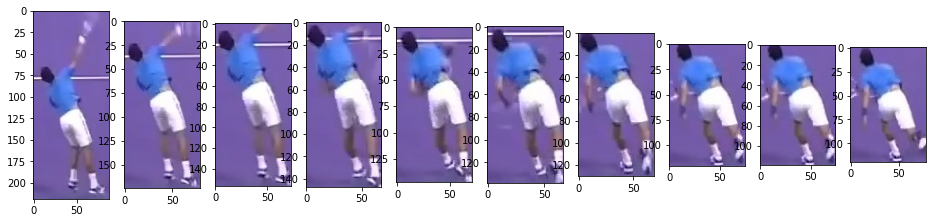

game3 Clip8 00024 0.672662436962128 44


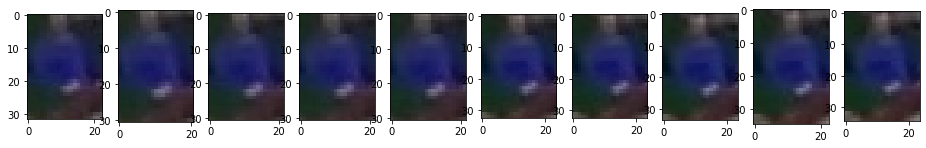

game3 Clip8 00002 0.600238561630249 36


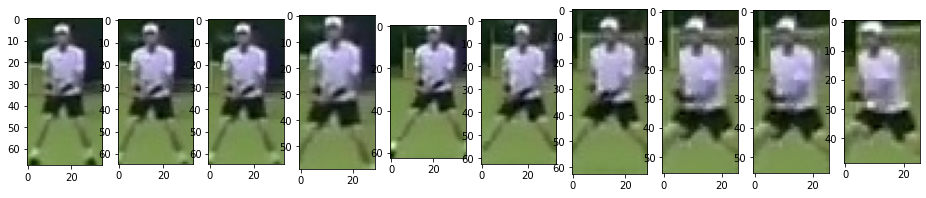

game3 Clip8 00064 0.5598852634429929 11


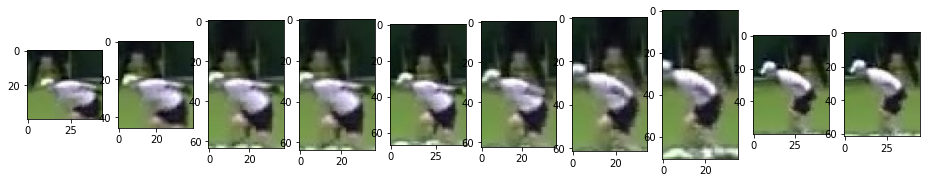

game3 Clip8 00003 0.50667142868042 46


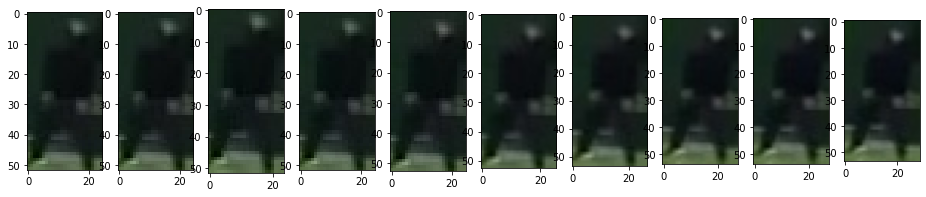

game3 Clip8 00062 0.49110808968544 13


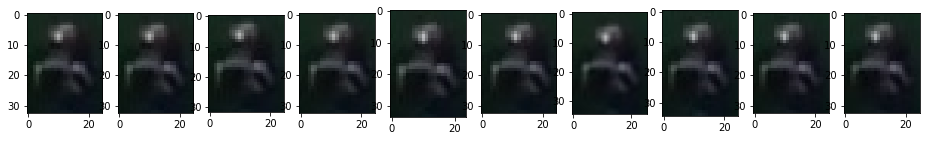

game3 Clip8 00005 0.487384527921677 40


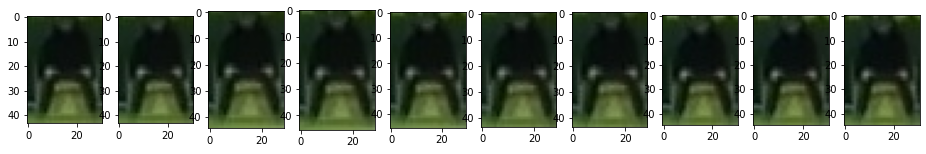

game3 Clip8 00039 0.48463827371597296 30


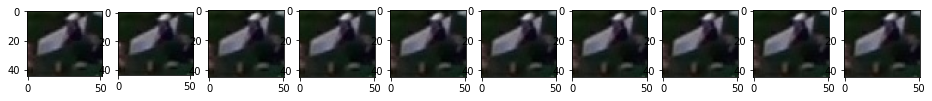

game3 Clip8 00012 0.481686413288116 46


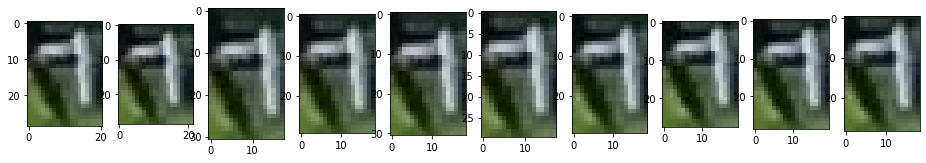

game3 Clip8 00041 0.46955531835556 2


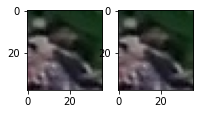

game3 Clip8 00019 0.465975284576416 46


KeyboardInterrupt: 

Error in callback <function flush_figures at 0x7f53f739bbf8> (for post_execute):


KeyboardInterrupt: 

In [10]:
# games = listdirs(data_dir, 'game')

columns = ['tracking_id', 'frame_index', 'xmin', 'ymin', 'xmax', 'ymax', 'confidence', 'image_name']
last_clip = None
for game in games:
    game_dir = osp.join(data_dir, game)
    clips = listdirs(game_dir, 'Clip')
    
    track_pid_paths = glob(osp.join(reid_dir, game, '*.csv'))
    track_pid_df_list = []
    
    for track_pid_path in track_pid_paths:
        person_name = osp.splitext(osp.basename(track_pid_path))[0]
        print(person_name)
        track_pid_df = pd.read_csv(track_pid_path)    
        
        track_pid_df = track_pid_df[track_pid_df.similarity > 0.4]
        for idx, item in track_pid_df.iterrows():
            clip = item['clip']
            if clip != last_clip:
                print('='*20, clip, '='*20)
            last_clip = clip
            tracking_id = '{:05}'.format(item['tracking_id'])
            similarity = item['similarity']

            clip_dir = osp.join(game_dir, clip)
            tracking_dir = osp.join(clip_dir, tracking_id)

            person_image_dir = osp.join(tracking_dir, 'person_image')
            image_names = listdirs(person_image_dir)
            image_names.sort()

            print(game, clip, tracking_id, similarity, len(image_names))
            plt.figure(figsize=(16,9))
            for num, image_name in enumerate(image_names, 1):
                image_path = osp.join(person_image_dir, image_name)
                image = cv2.imread(image_path)

                plt.subplot(1,10,num)
                plt.imshow(cv2.cvtColor(image, cv2.COLOR_RGB2BGR))
                if num >= 10:
                    break
            plt.show()
            plt.close()

# make movie

In [12]:
games = listdirs(input_dir, 'game')
# games = ['game1']

fourcc = cv2.VideoWriter_fourcc(*'H264')

columns = ['frame_index', 'tracking_id', 'xmin', 'ymin', 'xmax', 'ymax', 'confidence', 'image_name']
for game in games:
    game_dir = osp.join(input_dir, game)
    clips = listdirs(game_dir, 'Clip')
    
    track_pid_paths = glob(osp.join(reid_dir, game, '*.csv'))
    track_pid_df_list = []
    
    for track_pid_path in track_pid_paths:
        person_name = osp.splitext(osp.basename(track_pid_path))[0]
        print(person_name)
        track_pid_df = pd.read_csv(track_pid_path)
        
        track_pid_df = track_pid_df[track_pid_df.person==1]
        track_pid_df['person_name'] = person_name
        
        track_pid_df_list.append(track_pid_df)
    track_pid_df = pd.concat(strack_pid_df_list)
    
    for clip in clips:
        clip_dir = osp.join(game_dir, clip)
        file_names = listdirs(clip_dir)
        image_names = [file_name for file_name in file_names if osp.splitext(file_name)[1]=='.jpg']
        
        label_path = osp.join(label_save_dir, game, '{}.csv'.format(clip))
        label_df = pd.read_csv(label_path)
        results = label_df[['frame_index', 'xmin', 'ymin', 'width', 'height', 'tracking_id']].values
        
        movie_save_path = osp.join(movie_dir, game, '{}.mp4'.format(clip))
        os.makedirs(osp.dirname(movie_save_path), exist_ok=True)
        out = cv2.VideoWriter(movie_save_path, fourcc, 30, (1280, 720))
        print(game, clip)
        for image_name in image_names:
            frame_index = osp.splitext(image_name)[0]
            frame_path = osp.join(clip_dir, image_name)
            
            frame = cv2.imread(frame_path)
            bboxes = results[results[:, 0]==int(frame_index)][:, [1,2,3,4,5]]
                        
            for bbox in bboxes:
                ct = [bbox[0] + bbox[2] / 2, bbox[1] + bbox[3] / 2]
                
                df = track_pid_df[track_pid_df.tracking_id==bbox[4]]
                df = df[df['clip']==clip]
                if len(df) > 0:
                    c = (0, 0, 255)
                    person_name = df['person_name'].values[0]
                    cv2.putText(frame, person_name, (int(ct[0]) + 20, int(ct[1]) + 20), 
                            cv2.FONT_HERSHEY_SIMPLEX, 0.5, 
                            (0, 0, 0), thickness=3, lineType=cv2.LINE_AA)
                    cv2.putText(frame, person_name, (int(ct[0]) + 20, int(ct[1]) + 20), 
                            cv2.FONT_HERSHEY_SIMPLEX, 0.5, 
                            c, thickness=2, lineType=cv2.LINE_AA)
                else:
                    c = (0, 255, 0)
                
                cv2.rectangle(frame, (int(bbox[0]), int(bbox[1])), 
                              (int(bbox[0] + bbox[2]), int(bbox[1] + bbox[3])), 
                              c, 2, lineType=cv2.LINE_AA)
                
                txt = '{}'.format(bbox[4])
                
                cv2.putText(frame, txt, (int(ct[0]), int(ct[1])), 
                            cv2.FONT_HERSHEY_SIMPLEX, 0.5, 
                            (0, 0, 0), thickness=3, lineType=cv2.LINE_AA)
                cv2.putText(frame, txt, (int(ct[0]), int(ct[1])), 
                            cv2.FONT_HERSHEY_SIMPLEX, 0.5, 
                            c, thickness=2, lineType=cv2.LINE_AA)
            
            cv2.putText(frame, str(frame_index), (50, 50), 
                        cv2.FONT_HERSHEY_SIMPLEX, 1, 
                        (0, 0, 0), thickness=3, lineType=cv2.LINE_AA)
            cv2.putText(frame, str(frame_index), (50, 50),
                        cv2.FONT_HERSHEY_SIMPLEX, 1, 
                        (255, 255, 255), thickness=2, lineType=cv2.LINE_AA)

            
            cv2.imshow('image',frame)
            out.write(frame)
            if cv2.waitKey(1) & 0xFF == ord('q'):
                break
        cv2.destroyAllWindows()
        out.release()

Federer
Djokovic
game1 Clip1


KeyboardInterrupt: 

In [ ]:
fourcc = cv2.VideoWriter_fourcc(*'H264')
columns = ['frame_index', 'tracking_id', 'xmin', 'ymin', 'xmax', 'ymax', 'confidence', 'image_name']

In [32]:
game = 'game1'
clip = 'Clip5'

In [ ]:
from IPython.display import Video

In [33]:
game_dir = osp.join(input_dir, game)

track_pid_paths = glob(osp.join(reid_dir, game, '*.csv'))
track_pid_df_list = []

for track_pid_path in track_pid_paths:
    person_name = osp.splitext(osp.basename(track_pid_path))[0]
    print(person_name)
    track_pid_df = pd.read_csv(track_pid_path)

    track_pid_df = track_pid_df[track_pid_df.person==1]
    track_pid_df['person_name'] = person_name

    track_pid_df_list.append(track_pid_df)
track_pid_df = pd.concat(track_pid_df_list)

clip_dir = osp.join(game_dir, clip)
file_names = listdirs(clip_dir)
image_names = [file_name for file_name in file_names if osp.splitext(file_name)[1]=='.jpg']

label_path = osp.join(label_save_dir, game, '{}.csv'.format(clip))
label_df = pd.read_csv(label_path)
results = label_df[['frame_index', 'xmin', 'ymin', 'width', 'height', 'tracking_id']].values

movie_save_path = osp.join(movie_dir, game, '{}.mp4'.format(clip))
os.makedirs(osp.dirname(movie_save_path), exist_ok=True)
out = cv2.VideoWriter(movie_save_path, fourcc, 30, (1280, 720))

print(game, clip)
for image_name in image_names:
    frame_index = osp.splitext(image_name)[0]
    frame_path = osp.join(clip_dir, image_name)

    frame = cv2.imread(frame_path)
    bboxes = results[results[:, 0]==int(frame_index)][:, [1,2,3,4,5]]

    for bbox in bboxes:
        ct = [bbox[0] + bbox[2] / 2, bbox[1] + bbox[3] / 2]

        df = track_pid_df[track_pid_df.tracking_id==bbox[4]]
        df = df[df['clip']==clip]
        if len(df) > 0:
            c = (0, 0, 255)
            person_name = df['person_name'].values[0]
            cv2.putText(frame, person_name, (int(ct[0]) + 20, int(ct[1]) + 20), 
                    cv2.FONT_HERSHEY_SIMPLEX, 0.5, 
                    (0, 0, 0), thickness=3, lineType=cv2.LINE_AA)
            cv2.putText(frame, person_name, (int(ct[0]) + 20, int(ct[1]) + 20), 
                    cv2.FONT_HERSHEY_SIMPLEX, 0.5, 
                    c, thickness=2, lineType=cv2.LINE_AA)
        else:
            c = (0, 255, 0)

        cv2.rectangle(frame, (int(bbox[0]), int(bbox[1])), 
                      (int(bbox[0] + bbox[2]), int(bbox[1] + bbox[3])), 
                      c, 2, lineType=cv2.LINE_AA)

        txt = '{}'.format(bbox[4])

        cv2.putText(frame, txt, (int(ct[0]), int(ct[1])), 
                    cv2.FONT_HERSHEY_SIMPLEX, 0.5, 
                    (0, 0, 0), thickness=3, lineType=cv2.LINE_AA)
        cv2.putText(frame, txt, (int(ct[0]), int(ct[1])), 
                    cv2.FONT_HERSHEY_SIMPLEX, 0.5, 
                    c, thickness=2, lineType=cv2.LINE_AA)

    cv2.putText(frame, str(frame_index), (50, 50), 
                cv2.FONT_HERSHEY_SIMPLEX, 1, 
                (0, 0, 0), thickness=3, lineType=cv2.LINE_AA)
    cv2.putText(frame, str(frame_index), (50, 50),
                cv2.FONT_HERSHEY_SIMPLEX, 1, 
                (255, 255, 255), thickness=2, lineType=cv2.LINE_AA)


    # cv2.imshow('image',frame)
    out.write(frame)
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break
cv2.destroyAllWindows()
out.release()

Federer
Djokovic
game1 Clip5


In [34]:
Video(movie_save_path, width=640)